# Setup

In [1]:
import json

from bertopic import BERTopic
from urllib.parse import urlparse
import pandas as pd
import numpy as np
from tqdm.notebook import tqdm
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import geopandas
import ipywidgets as widgets
from ipywidgets import interact, interact_manual
from IPython.display import display, HTML

tqdm.pandas()

date_formatter = lambda ax : mdates.ConciseDateFormatter(ax.xaxis.get_major_locator())
pd.set_option('max_colwidth',None)
pd.set_option('display.max_columns', None)

In [2]:
current_palette = sns.color_palette()
first = current_palette[0]
second = current_palette[1]

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

In [3]:
def value_counts(series):
    return pd.concat(
        [
            series.value_counts().rename("count"),
            series.value_counts(normalize=True).rename("percentage"),
            series.value_counts(normalize=True).cumsum().rename("cumsum")
        ], axis=1
    )

## Data


<div class="alert alert-block alert-info">
Download the parsed claims from https://drive.google.com/file/d/1QlCtKtSwdUX6NWOcUXijmxi4JoSdp49O/view?usp=sharing
</div>

In [4]:
claims_path = "../claims_parse_urls-6m-hard_clean.json"

In [5]:
claims = pd.read_json(claims_path)

In [6]:
claims["media"] = claims.url.apply(lambda x: urlparse(x).hostname)

### Filter by language

In [7]:
european_languages = ["bg","hr","cs","da","nl","en","et","fi","fr","de","el","hu","ga","it","lv","lt","mt","pl","pt","ro","sk","sl","es","sv"]

In [16]:
claims = claims[claims.languageISO.apply(lambda x: x in european_languages)]

### Filter by continent

In [17]:
countries = {c:world[world.name.str.lower().str.contains(c.lower())].iloc[0]["iso_a3"] for c in claims.country.unique() if c and world.name.str.lower().str.contains(c.lower()).any()}

In [18]:
claims["iso_a3"] = claims.country.map(countries)

In [19]:
claims["continent"] = claims.iso_a3.map(world.set_index("iso_a3").continent.to_dict())

In [38]:
claims_europe = claims[claims["continent"] == "Europe"]

## EDA

In [21]:
language_count = value_counts(claims.languageISO)
language_count.head(5)

,count,percentage,cumsum
en,6849,0.492415,0.492415
pt,2815,0.202387,0.694802
es,1487,0.106909,0.801711
fr,634,0.045582,0.847293
it,629,0.045223,0.892516


In [22]:
source_count = value_counts(claims.media)

In [23]:
source_count.head(20)

,count,percentage,cumsum
leadstories.com,852,0.061255,0.061255
poligrafo.sapo.pt,747,0.053706,0.114962
factcheck.afp.com,728,0.052340,0.167302
factual.afp.com,598,0.042994,0.210295
newsmobile.in,522,0.037530,0.247825
www.usatoday.com,510,0.036667,0.284492
www.boatos.org,506,0.036379,0.320871
factly.in,494,0.035517,0.356388
demagog.org.pl,440,0.031634,0.388022
www.aosfatos.org,395,0.028399,0.416421


# BERTOPIC

In [24]:
from bertopic.vectorizers import ClassTfidfTransformer

## Helper functions

In [25]:
def top_k_claims(df,topic,k=3,asc=False):
    return df[df.cluster==topic].sort_values("probability",ascending=asc).head(k)

In [26]:
def topic_summary(topic,sample=2,asc=False):
    print(f"Topic {topic}: {len(claims[claims.cluster==topic])} articles")
    print(topic_model.get_topic(topic))
    display(top_k_claims(claims,topic,sample,asc)[["country","claimReviewed_t"]])

## Model using scrape article

In [27]:
docs = claims.text.tolist()

In [28]:
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)
topic_model = BERTopic(embedding_model="paraphrase-multilingual-MiniLM-L12-v2",verbose=True,ctfidf_model=ctfidf_model)

In [29]:
topics, probs = topic_model.fit_transform(docs)

Batches:   0%|          | 0/435 [00:00<?, ?it/s]

2023-03-16 09:13:33,192 - BERTopic - Transformed documents to Embeddings
2023-03-16 09:13:51,682 - BERTopic - Reduced dimensionality
2023-03-16 09:13:52,172 - BERTopic - Clustered reduced embeddings


In [30]:
claims["cluster"] = topics
claims["probability"] = probs

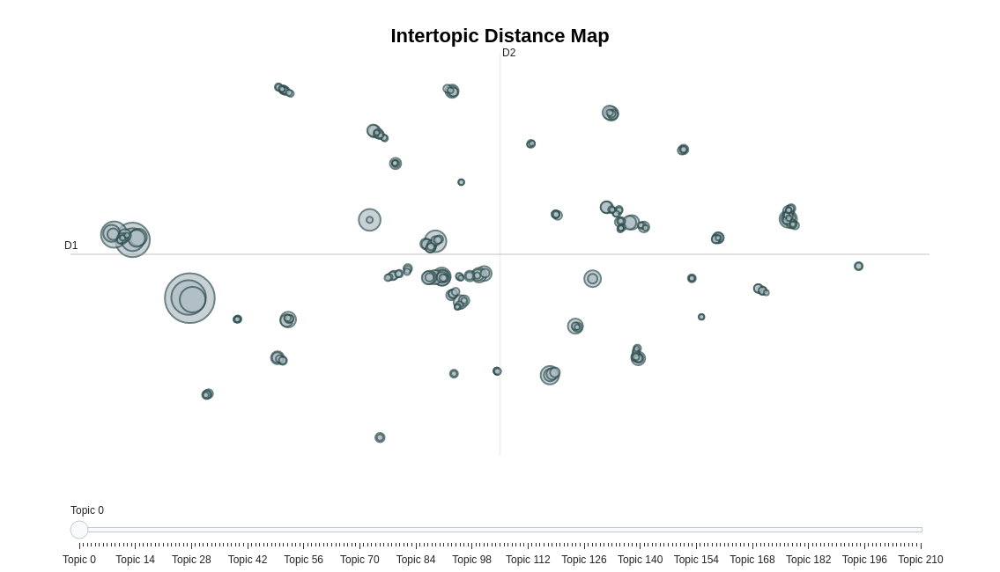

In [31]:
topic_model.visualize_topics()

100%|██████████████████████████████████████████████████████████████████████████████| 210/210 [00:01<00:00, 113.10it/s]


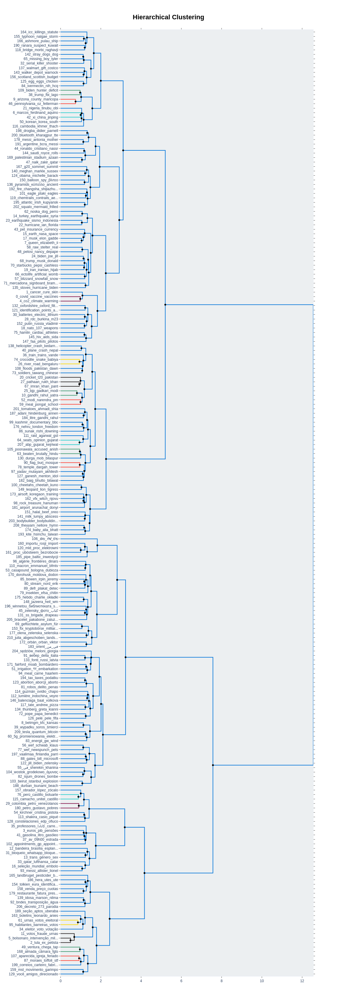

In [32]:
hierarchical_topics = topic_model.hierarchical_topics(docs)
topic_model.visualize_hierarchy(hierarchical_topics=hierarchical_topics)

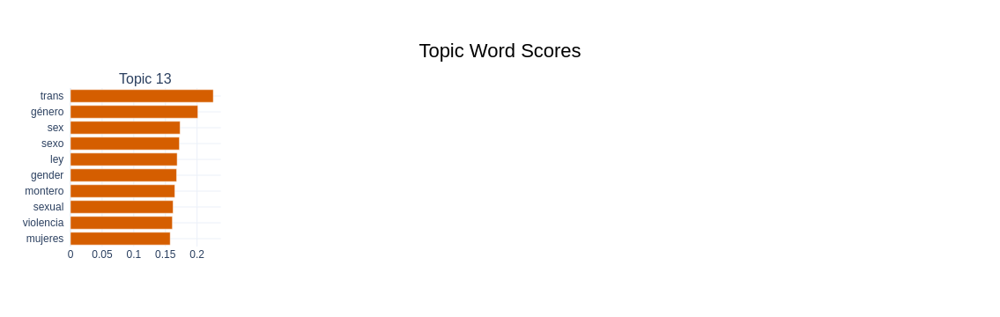

In [65]:
topic_model.visualize_barchart(topics=[13],n_words=10)

,count,percentage,cumsum
-1,4,0.307692,0.307692
28,2,0.153846,0.461538
32,1,0.076923,0.538462
142,1,0.076923,0.615385
0,1,0.076923,0.692308
42,1,0.076923,0.769231
72,1,0.076923,0.846154
15,1,0.076923,0.923077
23,1,0.076923,1.000000


In [93]:
query = "fraude"
condition = claims_europe.claimReviewed_t.str.lower().str.contains(query)
value_counts(claims_europe[condition].cluster)

,count,percentage,cumsum
-1,10,0.476190,0.476190
11,4,0.190476,0.666667
69,2,0.095238,0.761905
12,2,0.095238,0.857143
113,1,0.047619,0.904762
49,1,0.047619,0.952381
8,1,0.047619,1.000000


In [95]:
topic_summary(69,5)

Topic 69: 31 articles
[('geflüchtete', 0.36299560101169737), ('asylum', 0.2726034785005234), ('für', 0.26029580565945554), ('hartz', 0.2525934126742063), ('apa', 0.24380923358149176), ('herero', 0.23951234678358505), ('flixbus', 0.2333903363417053), ('seekers', 0.2316208622185979), ('hotels', 0.23109664170868607), ('accommodation', 0.22956050721321966)]


,country,claimReviewed_t
635334f549a4fc001414dc20,Germany,"La ministra de Relaciones Exteriores, Annalena Baerbock, dijo en la conferencia del partido federal de los Verdes que quería que entre ocho y diez millones de ""turistas de asilo"" emigraran al sistema social alemán."
639a2140b3e2a500138ea969,Germany,Los videos mostraron dos hoteles en Mallorca destinados a albergar a refugiados ucranianos. Los hoteles serían reconstruidos con dinero de los impuestos alemanes.
639b2880b3e2a5001398f363,Austria,Ucranianos conducen a Austria con Flixbus para cometer fraude social
6323f76e49a4fc001433f0df,Croatia,"Los refugiados de Ucrania en Croacia reciben HRK 4500, además de alojamiento y servicios públicos pagados."
639b1a72b3e2a5001398f313,Austria,Los refugiados se alojan en un hotel de lujo en Viena


In [94]:
topic_summary(11,5)

Topic 11: 105 articles
[('votos', 0.2526064255505002), ('fraude', 0.21855474537789124), ('urnas', 0.2184247713382038), ('bolsonaro', 0.20236418240419457), ('eleições', 0.1966138051606916), ('turno', 0.18078033705713284), ('votação', 0.17809390279816933), ('eleitoral', 0.17612721573148732), ('urna', 0.17480945892646196), ('tse', 0.1738263941781351)]


,country,claimReviewed_t
6356fee249a4fc001423b86b,Portugal,"""URGENTE...\nEjército solicita el código fuente del programa de centralización de votos. Hay una suposición de error con respecto al voto de la manada. El ITA y el IME harán la auditoría. Entiende cómo funciona de acuerdo con el audio que sigue""."
636d9142b763080012052feb,Brazil,"Chicos, la izquierda hizo un vínculo con un virus con un mensaje falso del G1 que dice que el TSE reconoció la victoria de Bolsonaro en las elecciones. A los que abrieron les dañaron los teléfonos."
633f984549a4fc0014addf2c,None,Un encuestador bolsonarista desesperado con un alto apoyo a Lula en Londres intentó incitar al fraude diciendo que la gente estaba obligada a votar por Bolsonaro. Hubo confusión y rompieron la urna. La votación tuvo que hacerse en papel.
637d2a5b77801f0012112a36,None,"Publicación en Facebook con una impresión de un supuesto informe de Jovem Pan News con el título ""El presidente de los Países Bajos confirma que hubo fraude en las elecciones presidenciales de Brasil"". En el pie de foto, el autor escribe: “Argentina, España, Italia y ahora Holanda… finalmente, el mundo ya está reconociendo el fraude electoral en Brasil”."
637cd60077801f00121126fe,Brazil,ENCONTRARON URNAS ILEGALMENTE DESCARTADAS EN EL DMLU DE PORTO ALEGRE


In [85]:
topic_summary(85,5)

Topic 85: 26 articles
[('bowen', 0.47563181744908345), ('irpin', 0.44055312006620195), ('jeremy', 0.33931540587319403), ('bbc', 0.3238723911042234), ('ланкастър', 0.25293792654332403), ('lancaster', 0.2430701939312565), ('beschuss', 0.2407367661603657), ('insult', 0.23184505557142185), ('reporter', 0.23119441384262507), ('shelling', 0.2272291020902044)]


,country,claimReviewed_t
633f984649a4fc0014addf4f,Poland,"Jeremy Bowen, un periodista de la BBC, fingió estar bajo fuego mientras informaba en Ucrania."
6347ac0249a4fc0014d58af1,Poland,"Jeremy Bowen, un reportero de la BBC, fingió estar bajo fuego durante un reportaje desde Ucrania."
63afd3d8d0625d001388b8e8,Georgia,Los medios occidentales no informan sobre el bombardeo de Belgorod.
637552b42da0cd001230a66d,Georgia,Los medios occidentales guardan silencio sobre el bombardeo en Belgorod.
6340bf9549a4fc0014b451e2,United Kingdom,"Una imagen muestra a un periodista de la BBC mientras “pretende estar en la línea del frente” de la guerra en Ucrania, con una mujer parada casualmente detrás de él."


In [35]:
topic_summary(14,10)

Topic 14: 102 articles
[('turkey', 0.36059291558255235), ('earthquake', 0.32816589274640245), ('syria', 0.26003026857901834), ('magnitude', 0.22913286140916606), ('turquie', 0.22340514406905332), ('building', 0.2197541159676631), ('terremoto', 0.21957774792358076), ('erdbeben', 0.2144914386155748), ('türkei', 0.21136120898065136), ('haarp', 0.20125656026173414)]


,country,claimReviewed_t
63e457d80061310012b6dd47,United States,El video muestra el colapso de un edificio en el reciente terremoto de Turquía.
63e19a40d3957e0012ac02a0,India,Este video muestra el derrumbe de un edificio en Siria después de que un poderoso terremoto azotara Turquía y Siria.
63e590b1aeae2d0012a0259a,India,"Terremoto en Turquía, cientos de personas retiraron escombros en busca de sobrevivientes."
63e2f3b6d3957e0012bd63e6,Brazil,Un hombre salta de un edificio durante un terremoto en Turquía el 6 de febrero de 2023.
63e2f3bbd3957e0012bd64c0,India,Video muestra autos temblando durante el terremoto en Türkiye
63e70c386e5b7d0012e7210f,India,Estos videos son imágenes recientes de los terremotos que afectaron a Turquía y Siria.
63e1c2d5d3957e0012af99fd,Mexico,Video muestra que un hombre se lanza de un edificio durante el sismo del 6 de febrero de 2023 en Turquía
63e457d90061310012b6dda8,India,Imágenes de CCTV del reciente terremoto en Turquía (2023)
63ead4cbbe469200124013eb,United States,Video de torres derrumbándose en terremoto Turquía-Siria
63e1322ad3957e0012a1e3d6,India,Imágenes del derrumbe de un edificio en Turquía debido al terremoto del 6 de febrero de 2023


## Model using summary

In [53]:
docs = claims.summary.tolist()

In [57]:
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)
topic_model = BERTopic(embedding_model="paraphrase-multilingual-MiniLM-L12-v2",verbose=True,ctfidf_model=ctfidf_model)

In [ ]:
topics, probs = topic_model.fit_transform(docs)

Batches:   0%|          | 0/435 [00:00<?, ?it/s]

In [ ]:
claims["cluster"] = topics
claims["probability"] = probs

In [ ]:
topic_model.visualize_topics()

In [59]:
topic_summary(7,10)

Topic 7: 56 articles
[('litro', 0.39071863243233934), ('gás', 0.3482835145223764), ('eletricidade', 0.3310023575427997), ('gasolina', 0.32261023837331404), ('gasóleo', 0.31883605505711876), ('mwh', 0.3154372443141415), ('combustíveis', 0.3121229652250376), ('iva', 0.31114216392208155), ('cêntimos', 0.3052886364554345), ('preço', 0.295633327102727)]


,country,claimReviewed
6306b1af49a4fc0014d37694,Portugal,Gasóleo já está mais caro do que a gasolina em muitos postos de combustível.
63472cd749a4fc0014cec970,France,1500 euros d'amende si l'on chauffe son logement à plus de 19°C cet hiver
63488cc949a4fc0014d5928b,Portugal,"Portugal tem ""os combustíveis mais caros da Europa""."
63488cc649a4fc0014d59285,France,Le mégawatt produit en France est vendu 42€ à l'Allemagne et racheté 1.000€
634f402549a4fc0014ff19d1,Portugal,"""Preço do crude baixou 23 dólares nos últimos cinco dias"""
6352e08849a4fc00140d8dd1,Portugal,"França tem gasolina a €1,6/l e salário mínimo de €1.750 enquanto Portugal tem €1,9/l e €705."
630ed15349a4fc0014ea874d,Portugal,"Não preciso de separar o lixo, porque já pago a taxa de gestão de resíduos"
635c1b4e49a4fc00144253e1,Portugal,"Governo mantém ""um imposto por litro de 43,1% na gasolina e de 46,9% no gasóleo""."
635da61e49a4fc00144a60ae,Portugal,"""Conheça de onde vem o gás e o petróleo que Portugal importa. Quem diria, é a Nigéria o nosso maior fornecedor."""
63602c6349a4fc00145a4b6f,Portugal,"A gasolina e os impostos estão mais elevados do que no tempo da ""troika""."


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 62/62 [00:00<00:00, 171.32it/s]


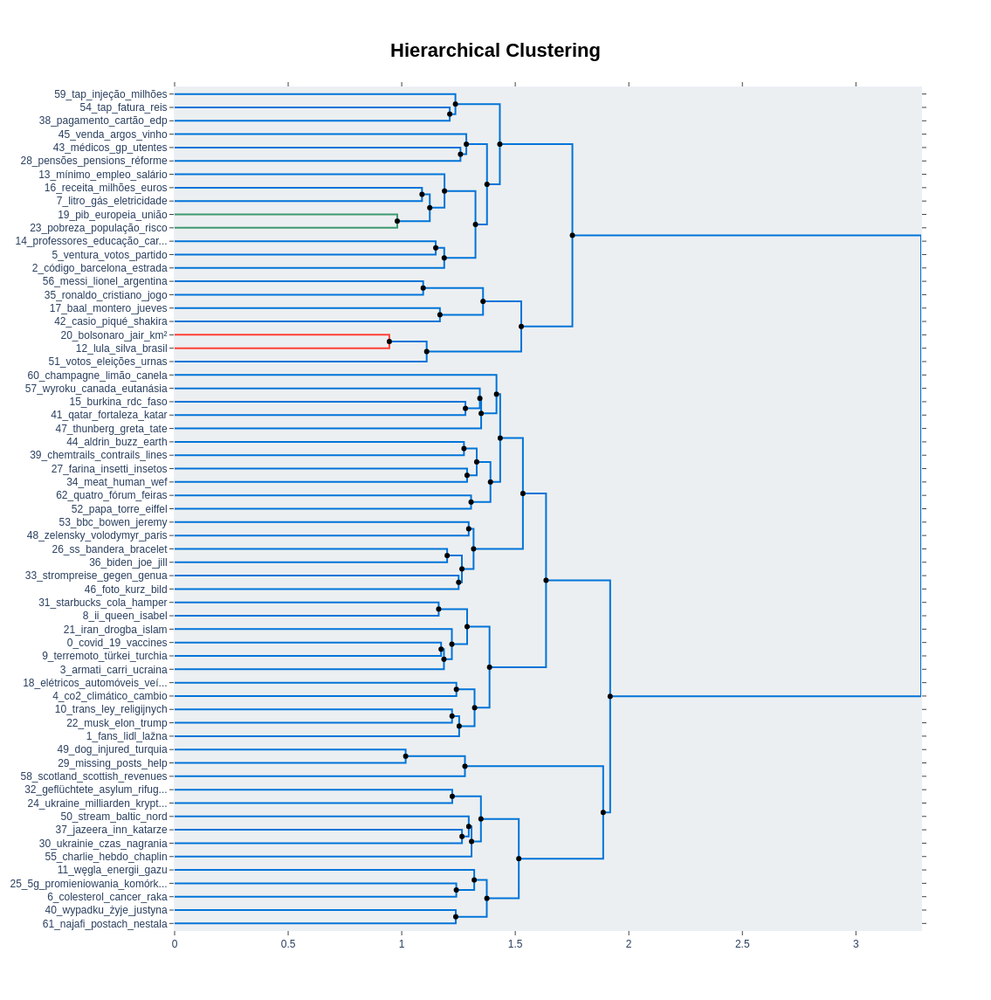

In [37]:
hierarchical_topics = topic_model.hierarchical_topics(docs)
topic_model.visualize_hierarchy(hierarchical_topics=hierarchical_topics)

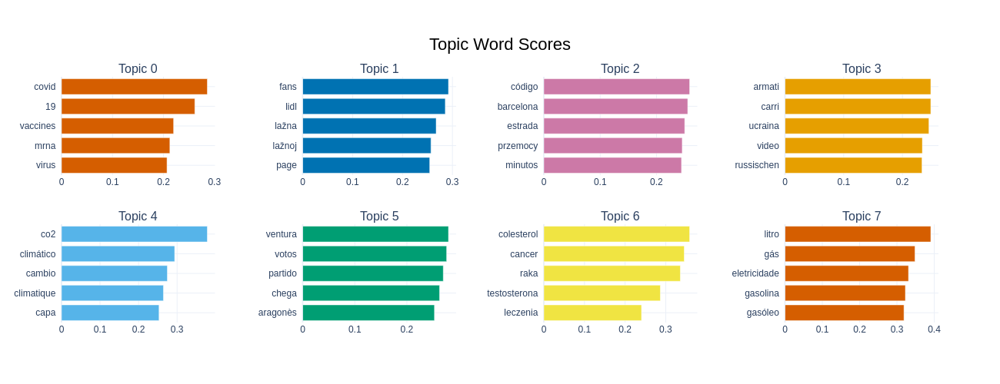

In [38]:
topic_model.visualize_barchart()

## Model using scrape article

In [39]:
docs = claims.claimsReviewed.tolist()

AttributeError: 'DataFrame' object has no attribute 'claimsReviewed'

In [20]:
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)
topic_model = BERTopic(embedding_model="paraphrase-multilingual-MiniLM-L12-v2",verbose=True,ctfidf_model=ctfidf_model)

In [21]:
topics, probs = topic_model.fit_transform(docs)

Batches:   0%|          | 0/107 [00:00<?, ?it/s]

2023-03-14 10:14:29,799 - BERTopic - Transformed documents to Embeddings
2023-03-14 10:14:47,776 - BERTopic - Reduced dimensionality
2023-03-14 10:14:47,879 - BERTopic - Clustered reduced embeddings


In [23]:
claims["cluster"] = topics
claims["probability"] = probs

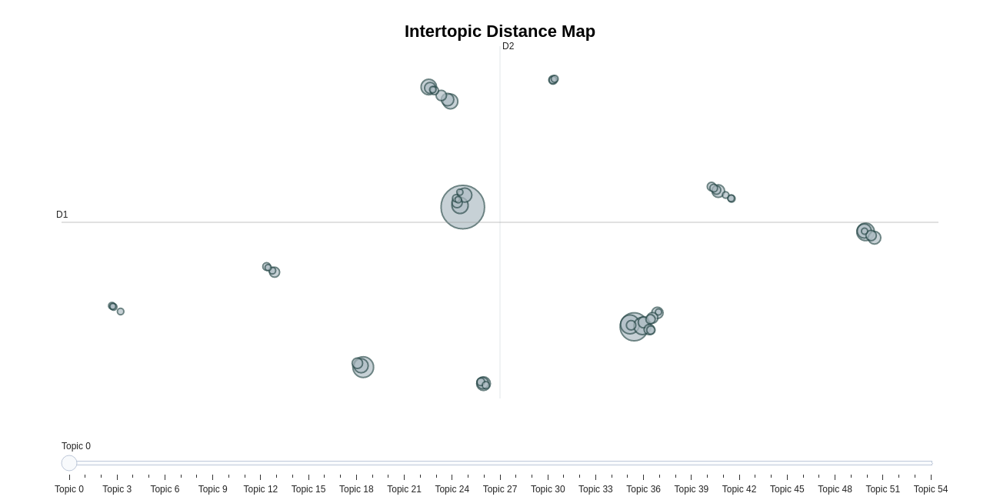

In [28]:
topic_model.visualize_topics()

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 160.67it/s]


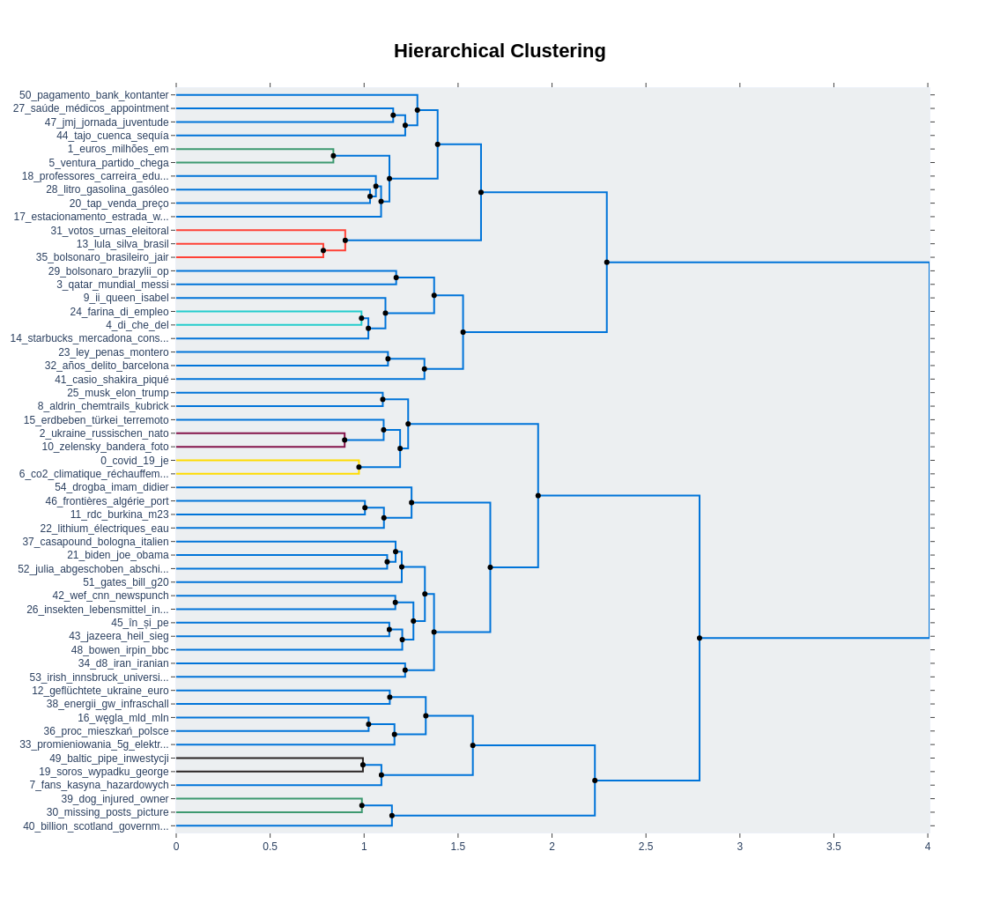

In [29]:
hierarchical_topics = topic_model.hierarchical_topics(docs)
topic_model.visualize_hierarchy(hierarchical_topics=hierarchical_topics)

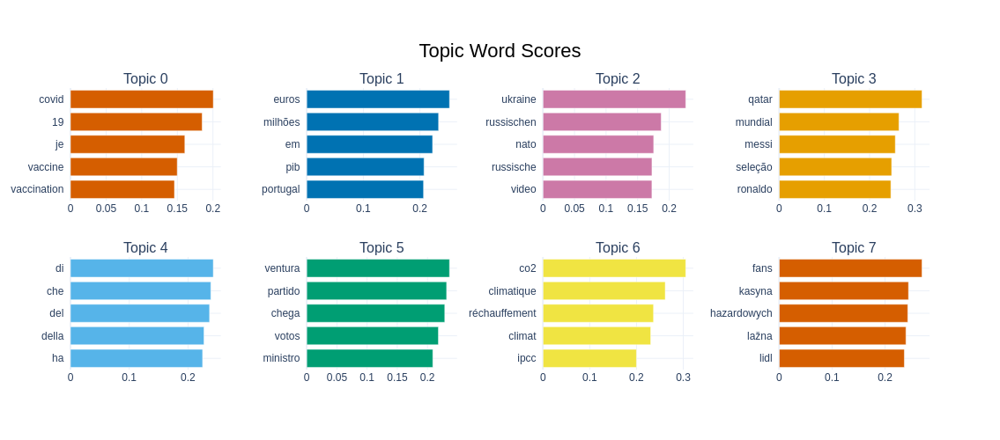

In [30]:
topic_model.visualize_barchart()